<a href="https://colab.research.google.com/github/OlgaNezh/Computer_Vision/blob/main/CV_HW_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Реализовать синтезирование лиц из LFW с помощью DCGAN
Библиотеки: [Python, Tensorflow]


In [ ]:
%tensorflow_version 2.x

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

### Загрузка датасета

In [ ]:
train_ds, ds_info = tfds.load('lfw', 
                              as_supervised=True, 
                              with_info=True,  
                              split='train') 

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/13233 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/lfw/0.1.0.incompleteYNSSQZ/lfw-train.tfrecord*...:   0%|          | 0/13233 [0…

Dataset lfw downloaded and prepared to ~/tensorflow_datasets/lfw/0.1.0. Subsequent calls will reuse this data.


In [ ]:
ds_info.features

FeaturesDict({
    'image': Image(shape=(250, 250, 3), dtype=tf.uint8),
    'label': Text(shape=(), dtype=tf.string),
})

In [ ]:
len(train_ds)

13233

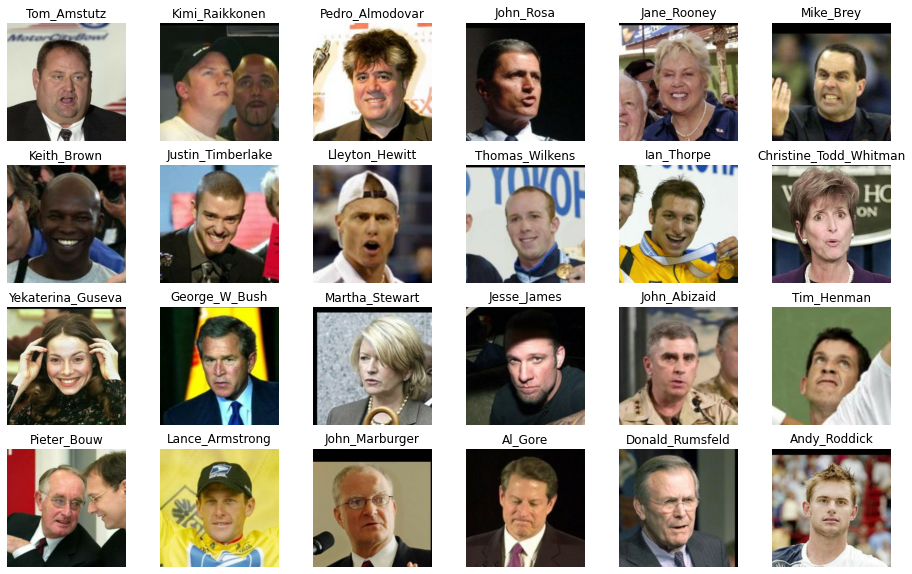

In [ ]:
plt.figure(figsize=(16, 10))
for j, (label, image) in enumerate(train_ds.take(24)):
    plt.subplot(4, 6, j+1)
    plt.title(label.numpy().decode('utf-8')) 
    plt.imshow(image)
    plt.axis('off')

### Подготовка пайплайна данных <a id='section_1'></a>

In [ ]:
INPUT_DIM = 100
INP_SIZE = 64
NUM_EPOCHS = 50
HALF_BATCH_SIZE = 16  
BATCH_SIZE = HALF_BATCH_SIZE * 2  
LEARNING_RATE = 0.0002

def preprocessing(img):
  img = (tf.cast(img, tf.float32) - 127.5) / 127.5  
  return tf.image.resize(img, (INP_SIZE, INP_SIZE))

train_ds = train_ds.shuffle(buffer_size=len(train_ds))
train_ds = train_ds.map(lambda label, img: (preprocessing(img), label))
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

In [ ]:
for image, label in train_ds:
  print(image.shape)
  print(label.shape)
  break

(16, 64, 64, 3)
(16,)


### Deep Convolutional GAN (DCGAN) <a id='section_2'></a>

In [ ]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(128*16*16, activation='relu'),
    tf.keras.layers.Reshape((16, 16, 128)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
syntetic_images.shape

1/1 [==============================] - 8s 8s/step


(16, 64, 64, 3)

In [ ]:
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

decision = discriminator(syntetic_images)
print(decision)

tf.Tensor(
[[-6.8987894e-05]
 [-9.7313465e-04]
 [-2.5725341e-03]
 [-4.7760773e-03]
 [-3.8191003e-03]
 [ 4.5208470e-04]
 [-1.5834515e-03]
 [-5.8348646e-04]
 [-4.0215477e-03]
 [-1.7588257e-03]
 [-2.5657369e-03]
 [-2.2884263e-03]
 [-1.5542489e-03]
 [-1.8963026e-03]
 [-1.6212704e-03]
 [-3.5737040e-03]], shape=(16, 1), dtype=float32)


### Компиляция модели

In [ ]:
optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def plot_results(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        new_img = (samples[j, ...] * 127.5) + 127.5
        new_img = (tf.cast(new_img, tf.int16))
        ax.imshow(new_img)
        plt.xticks([]), plt.yticks([])
    plt.show()

### Обучение модели

1/1 [==============================] - 0s 19ms/step
[Step  0] D Loss: 1.0373; G Loss: 0.6492
1/1 [==============================] - 0s 118ms/step


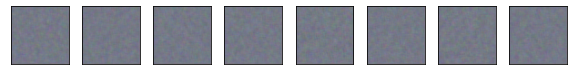

1/1 [==============================] - 0s 14ms/step
[Step 500] D Loss: 0.5000; G Loss: 1.3534
1/1 [==============================] - 0s 16ms/step


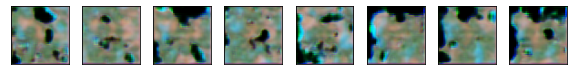

1/1 [==============================] - 0s 21ms/step
[Step 1000] D Loss: 0.6901; G Loss: 3.5183
1/1 [==============================] - 0s 16ms/step


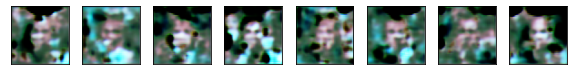

1/1 [==============================] - 0s 14ms/step
[Step 1500] D Loss: 0.2340; G Loss: 2.9091
1/1 [==============================] - 0s 14ms/step


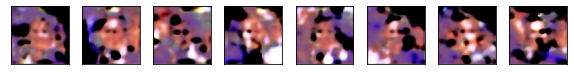

1/1 [==============================] - 0s 17ms/step
[Step 2000] D Loss: 0.4012; G Loss: 1.3906
1/1 [==============================] - 0s 14ms/step


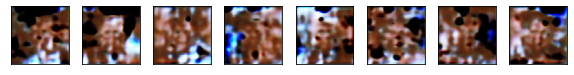

1/1 [==============================] - 0s 15ms/step
[Step 2500] D Loss: 0.0183; G Loss: 1.1337
1/1 [==============================] - 0s 20ms/step


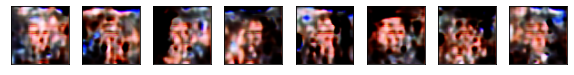

1/1 [==============================] - 0s 17ms/step
[Step 3000] D Loss: 0.1763; G Loss: 4.3677
1/1 [==============================] - 0s 15ms/step


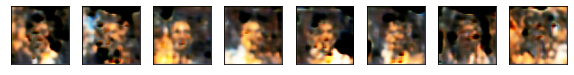

1/1 [==============================] - 0s 43ms/step
[Step 3500] D Loss: 0.1895; G Loss: 2.3663
1/1 [==============================] - 0s 20ms/step


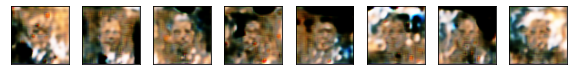

1/1 [==============================] - 0s 14ms/step
[Step 4000] D Loss: 0.1565; G Loss: 3.3098
1/1 [==============================] - 0s 15ms/step


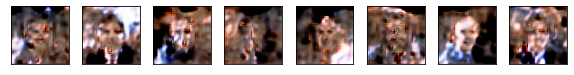

1/1 [==============================] - 0s 20ms/step
[Step 4500] D Loss: 0.0164; G Loss: 3.2897
1/1 [==============================] - 0s 15ms/step


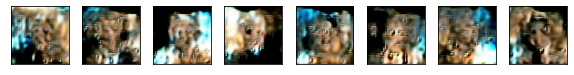

1/1 [==============================] - 0s 14ms/step
[Step 5000] D Loss: 0.1177; G Loss: 2.6365
1/1 [==============================] - 0s 14ms/step


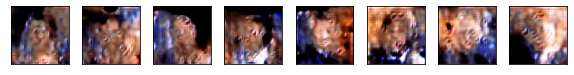

1/1 [==============================] - 0s 14ms/step
[Step 5500] D Loss: 0.2294; G Loss: 1.0783
1/1 [==============================] - 0s 14ms/step


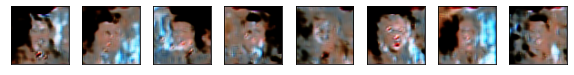

1/1 [==============================] - 0s 17ms/step
[Step 6000] D Loss: 0.1259; G Loss: 3.3552
1/1 [==============================] - 0s 17ms/step


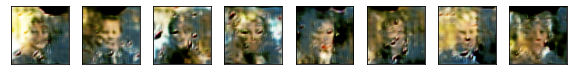

1/1 [==============================] - 0s 14ms/step
[Step 6500] D Loss: 0.3041; G Loss: 3.5972
1/1 [==============================] - 0s 14ms/step


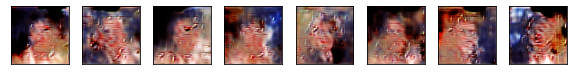

1/1 [==============================] - 0s 16ms/step
[Step 7000] D Loss: 0.1912; G Loss: 3.7713
1/1 [==============================] - 0s 14ms/step


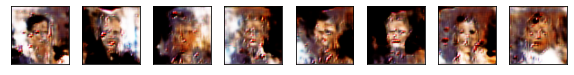

1/1 [==============================] - 0s 14ms/step
[Step 7500] D Loss: 0.7628; G Loss: 1.2215
1/1 [==============================] - 0s 15ms/step


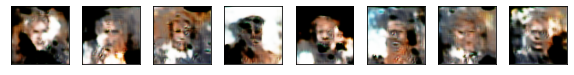

1/1 [==============================] - 0s 14ms/step
[Step 8000] D Loss: 0.8707; G Loss: 0.6517
1/1 [==============================] - 0s 17ms/step


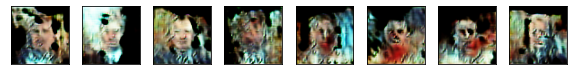

1/1 [==============================] - 0s 17ms/step
[Step 8500] D Loss: 0.7497; G Loss: 0.7985
1/1 [==============================] - 0s 15ms/step


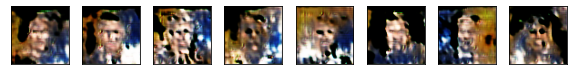

1/1 [==============================] - 0s 17ms/step
[Step 9000] D Loss: 0.7055; G Loss: 2.0510
1/1 [==============================] - 0s 14ms/step


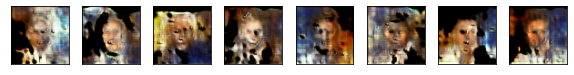

1/1 [==============================] - 0s 17ms/step
[Step 9500] D Loss: 0.4366; G Loss: 0.8084
1/1 [==============================] - 0s 14ms/step


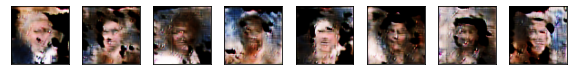

1/1 [==============================] - 0s 17ms/step
[Step 10000] D Loss: 0.3046; G Loss: 2.9652
1/1 [==============================] - 0s 16ms/step


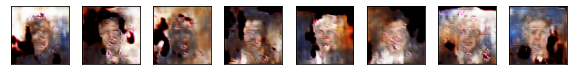

1/1 [==============================] - 0s 15ms/step
[Step 10500] D Loss: 0.1722; G Loss: 3.9160
1/1 [==============================] - 0s 17ms/step


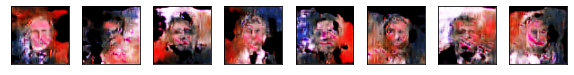

1/1 [==============================] - 0s 14ms/step
[Step 11000] D Loss: 0.8133; G Loss: 2.6868
1/1 [==============================] - 0s 15ms/step


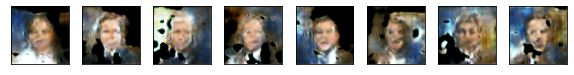

1/1 [==============================] - 0s 15ms/step
[Step 11500] D Loss: 0.4014; G Loss: 3.8096
1/1 [==============================] - 0s 14ms/step


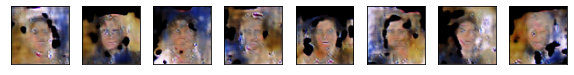

1/1 [==============================] - 0s 16ms/step
[Step 12000] D Loss: 0.2637; G Loss: 2.4931
1/1 [==============================] - 0s 15ms/step


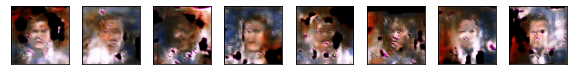

1/1 [==============================] - 0s 17ms/step
[Step 12500] D Loss: 0.1823; G Loss: 4.6335
1/1 [==============================] - 0s 15ms/step


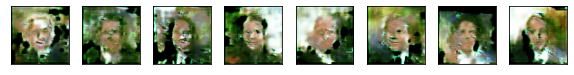

1/1 [==============================] - 0s 16ms/step
[Step 13000] D Loss: 0.1938; G Loss: 3.7677
1/1 [==============================] - 0s 18ms/step


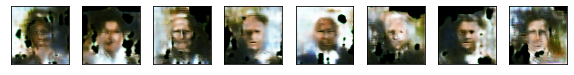

1/1 [==============================] - 0s 14ms/step
[Step 13500] D Loss: 0.6855; G Loss: 2.4723
1/1 [==============================] - 0s 15ms/step


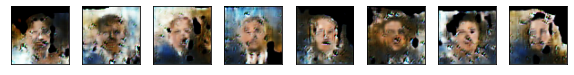

1/1 [==============================] - 0s 17ms/step
[Step 14000] D Loss: 0.4083; G Loss: 3.4906
1/1 [==============================] - 0s 15ms/step


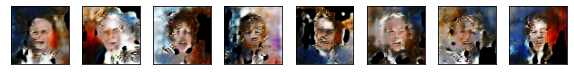

1/1 [==============================] - 0s 14ms/step
[Step 14500] D Loss: 0.2655; G Loss: 3.0684
1/1 [==============================] - 0s 18ms/step


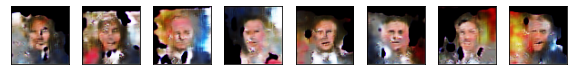

1/1 [==============================] - 0s 14ms/step
[Step 15000] D Loss: 0.5661; G Loss: 2.1146
1/1 [==============================] - 0s 14ms/step


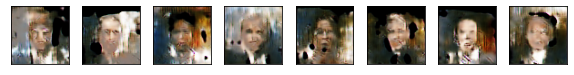

1/1 [==============================] - 0s 18ms/step
[Step 15500] D Loss: 0.2512; G Loss: 3.2934
1/1 [==============================] - 0s 14ms/step


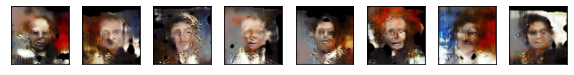

1/1 [==============================] - 0s 15ms/step
[Step 16000] D Loss: 0.0963; G Loss: 3.1521
1/1 [==============================] - 0s 14ms/step


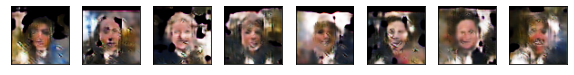

1/1 [==============================] - 0s 14ms/step
[Step 16500] D Loss: 0.8957; G Loss: 2.4072
1/1 [==============================] - 0s 14ms/step


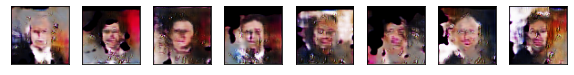

1/1 [==============================] - 0s 15ms/step
[Step 17000] D Loss: 0.1524; G Loss: 2.3789
1/1 [==============================] - 0s 14ms/step


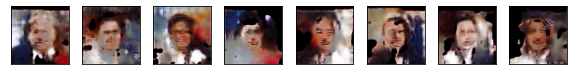

1/1 [==============================] - 0s 21ms/step
[Step 17500] D Loss: 0.4547; G Loss: 2.7220
1/1 [==============================] - 0s 15ms/step


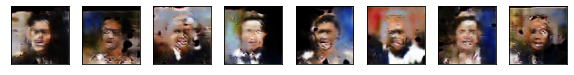

1/1 [==============================] - 0s 22ms/step
[Step 18000] D Loss: 0.3278; G Loss: 2.4389
1/1 [==============================] - 0s 22ms/step


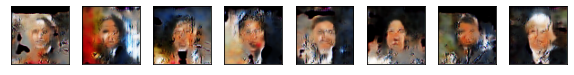

1/1 [==============================] - 0s 16ms/step
[Step 18500] D Loss: 0.6109; G Loss: 1.9009
1/1 [==============================] - 0s 15ms/step


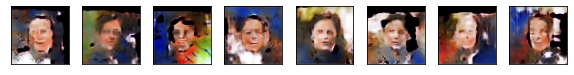

1/1 [==============================] - 0s 18ms/step
[Step 19000] D Loss: 0.4441; G Loss: 3.0514
1/1 [==============================] - 0s 18ms/step


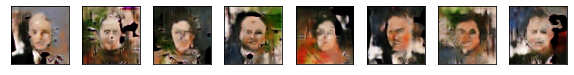

1/1 [==============================] - 0s 15ms/step
[Step 19500] D Loss: 0.3617; G Loss: 2.5439
1/1 [==============================] - 0s 17ms/step


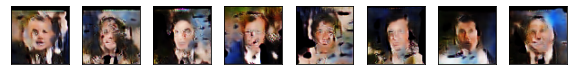

1/1 [==============================] - 0s 15ms/step
[Step 20000] D Loss: 0.4489; G Loss: 2.4281
1/1 [==============================] - 0s 16ms/step


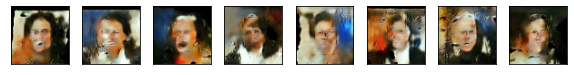

1/1 [==============================] - 0s 15ms/step
[Step 20500] D Loss: 1.0520; G Loss: 1.2293
1/1 [==============================] - 0s 18ms/step


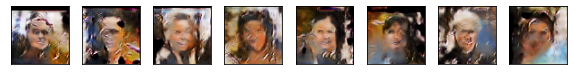

1/1 [==============================] - 0s 17ms/step
[Step 21000] D Loss: 0.4184; G Loss: 1.1600
1/1 [==============================] - 0s 15ms/step


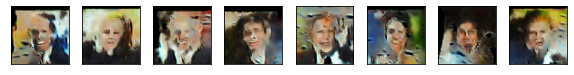

1/1 [==============================] - 0s 16ms/step
[Step 21500] D Loss: 0.5107; G Loss: 1.8870
1/1 [==============================] - 0s 19ms/step


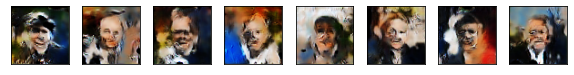

1/1 [==============================] - 0s 15ms/step
[Step 22000] D Loss: 0.4290; G Loss: 2.3241
1/1 [==============================] - 0s 20ms/step


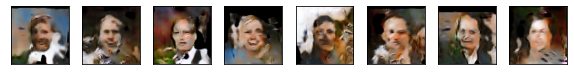

1/1 [==============================] - 0s 21ms/step
[Step 22500] D Loss: 0.5512; G Loss: 1.1720
1/1 [==============================] - 0s 17ms/step


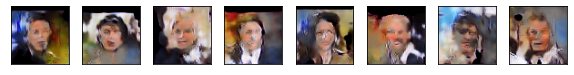

1/1 [==============================] - 0s 22ms/step
[Step 23000] D Loss: 0.4469; G Loss: 1.0402
1/1 [==============================] - 0s 20ms/step


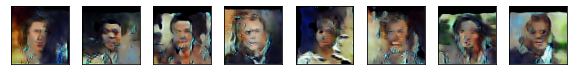

1/1 [==============================] - 0s 17ms/step
[Step 23500] D Loss: 0.4063; G Loss: 2.5963
1/1 [==============================] - 0s 19ms/step


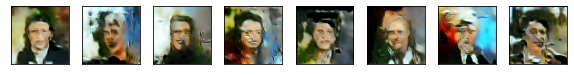

1/1 [==============================] - 0s 20ms/step
[Step 24000] D Loss: 0.6464; G Loss: 2.2088
1/1 [==============================] - 0s 14ms/step


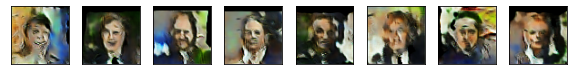

1/1 [==============================] - 0s 26ms/step
[Step 24500] D Loss: 0.3827; G Loss: 2.4999
1/1 [==============================] - 0s 19ms/step


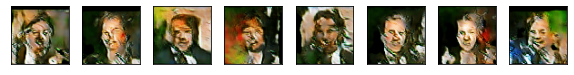

1/1 [==============================] - 0s 22ms/step
[Step 25000] D Loss: 0.5625; G Loss: 1.1292
1/1 [==============================] - 0s 19ms/step


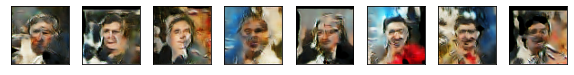

1/1 [==============================] - 0s 26ms/step
[Step 25500] D Loss: 0.7959; G Loss: 1.6676
1/1 [==============================] - 0s 21ms/step


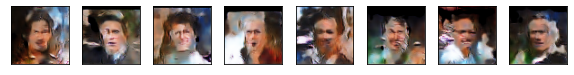

1/1 [==============================] - 0s 23ms/step
[Step 26000] D Loss: 0.5529; G Loss: 1.1010
1/1 [==============================] - 0s 22ms/step


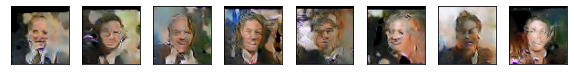

1/1 [==============================] - 0s 24ms/step
[Step 26500] D Loss: 0.8331; G Loss: 1.7581
1/1 [==============================] - 0s 24ms/step


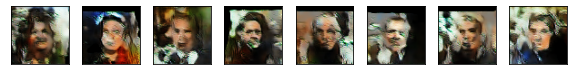

1/1 [==============================] - 0s 20ms/step
[Step 27000] D Loss: 0.3208; G Loss: 1.6060
1/1 [==============================] - 0s 20ms/step


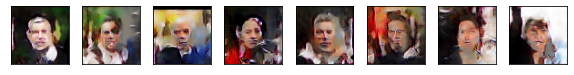

1/1 [==============================] - 0s 21ms/step
[Step 27500] D Loss: 0.5648; G Loss: 1.6323
1/1 [==============================] - 0s 23ms/step


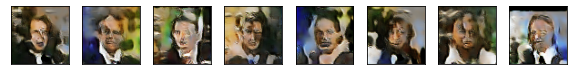

1/1 [==============================] - 0s 20ms/step
[Step 28000] D Loss: 0.5342; G Loss: 1.2543
1/1 [==============================] - 0s 27ms/step


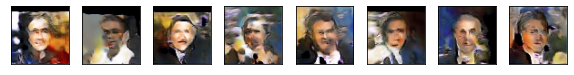

1/1 [==============================] - 0s 25ms/step
[Step 28500] D Loss: 0.6256; G Loss: 1.8185
1/1 [==============================] - 0s 25ms/step


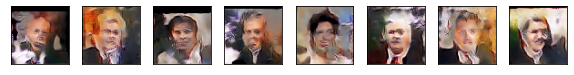

1/1 [==============================] - 0s 21ms/step
[Step 29000] D Loss: 0.4607; G Loss: 1.6422
1/1 [==============================] - 0s 25ms/step


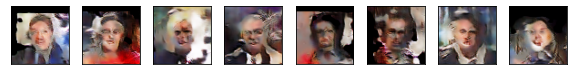

1/1 [==============================] - 0s 26ms/step
[Step 29500] D Loss: 0.3997; G Loss: 0.6489
1/1 [==============================] - 0s 24ms/step


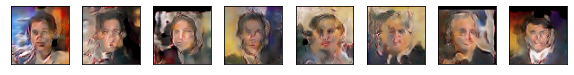

1/1 [==============================] - 0s 32ms/step
[Step 30000] D Loss: 0.5108; G Loss: 1.2710
1/1 [==============================] - 0s 21ms/step


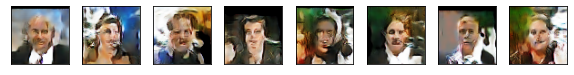

1/1 [==============================] - 0s 24ms/step
[Step 30500] D Loss: 0.5478; G Loss: 0.7715
1/1 [==============================] - 0s 24ms/step


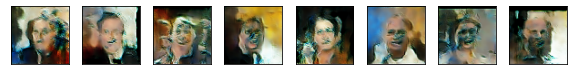

1/1 [==============================] - 0s 26ms/step
[Step 31000] D Loss: 0.5413; G Loss: 1.3570
1/1 [==============================] - 0s 20ms/step


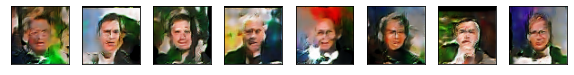

1/1 [==============================] - 0s 22ms/step
[Step 31500] D Loss: 0.4512; G Loss: 1.5100
1/1 [==============================] - 0s 25ms/step


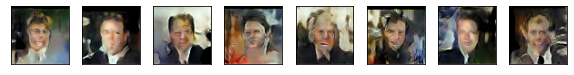

1/1 [==============================] - 0s 22ms/step
[Step 32000] D Loss: 0.5348; G Loss: 1.5089
1/1 [==============================] - 0s 23ms/step


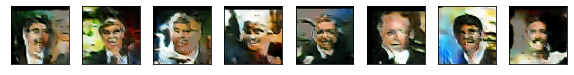

1/1 [==============================] - 0s 22ms/step
[Step 32500] D Loss: 0.4919; G Loss: 1.0619
1/1 [==============================] - 0s 21ms/step


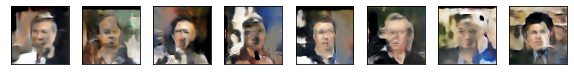

1/1 [==============================] - 0s 21ms/step
[Step 33000] D Loss: 0.6063; G Loss: 1.4935
1/1 [==============================] - 0s 29ms/step


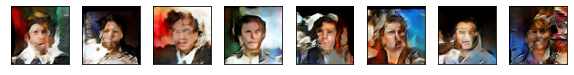

1/1 [==============================] - 0s 21ms/step
[Step 33500] D Loss: 0.6021; G Loss: 1.6052
1/1 [==============================] - 0s 20ms/step


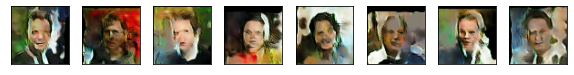

1/1 [==============================] - 0s 29ms/step
[Step 34000] D Loss: 0.7147; G Loss: 1.5076
1/1 [==============================] - 0s 31ms/step


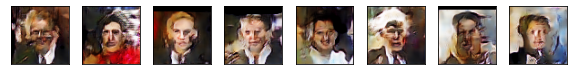

1/1 [==============================] - 0s 22ms/step
[Step 34500] D Loss: 0.6319; G Loss: 0.6509
1/1 [==============================] - 0s 30ms/step


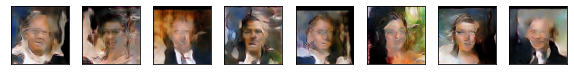

1/1 [==============================] - 0s 25ms/step
[Step 35000] D Loss: 0.7221; G Loss: 1.5586
1/1 [==============================] - 0s 24ms/step


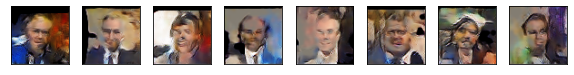

1/1 [==============================] - 0s 20ms/step
[Step 35500] D Loss: 0.7698; G Loss: 1.2705
1/1 [==============================] - 0s 21ms/step


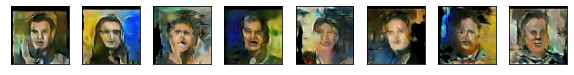

1/1 [==============================] - 0s 33ms/step
[Step 36000] D Loss: 0.6797; G Loss: 1.2373
1/1 [==============================] - 0s 26ms/step


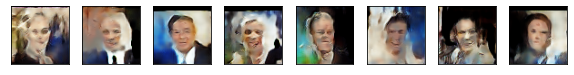

1/1 [==============================] - 0s 29ms/step
[Step 36500] D Loss: 0.7086; G Loss: 0.8535
1/1 [==============================] - 0s 25ms/step


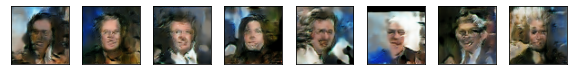

1/1 [==============================] - 0s 30ms/step
[Step 37000] D Loss: 0.5153; G Loss: 1.8653
1/1 [==============================] - 0s 22ms/step


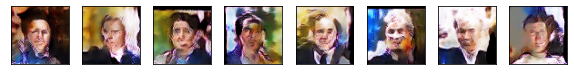

1/1 [==============================] - 0s 20ms/step
[Step 37500] D Loss: 0.5048; G Loss: 1.7654
1/1 [==============================] - 0s 21ms/step


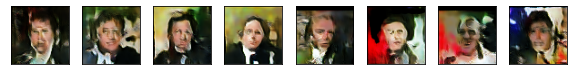

1/1 [==============================] - 0s 23ms/step
[Step 38000] D Loss: 0.6678; G Loss: 1.4652
1/1 [==============================] - 0s 21ms/step


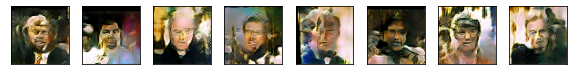

1/1 [==============================] - 0s 22ms/step
[Step 38500] D Loss: 0.5763; G Loss: 1.4663
1/1 [==============================] - 0s 21ms/step


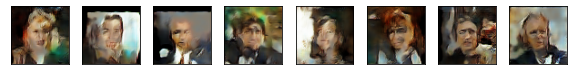

1/1 [==============================] - 0s 21ms/step
[Step 39000] D Loss: 0.9654; G Loss: 0.7972
1/1 [==============================] - 0s 23ms/step


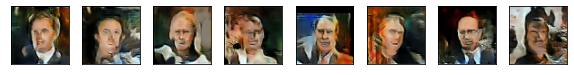

1/1 [==============================] - 0s 23ms/step
[Step 39500] D Loss: 0.4864; G Loss: 1.6179
1/1 [==============================] - 0s 26ms/step


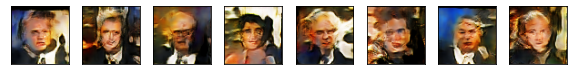

1/1 [==============================] - 0s 24ms/step
[Step 40000] D Loss: 0.7459; G Loss: 1.1208
1/1 [==============================] - 0s 25ms/step


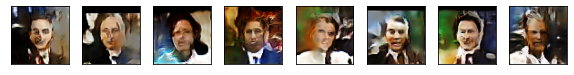

1/1 [==============================] - 0s 25ms/step
[Step 40500] D Loss: 0.6400; G Loss: 0.9486
1/1 [==============================] - 0s 26ms/step


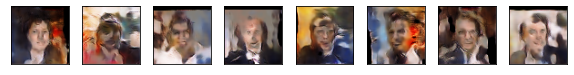

1/1 [==============================] - 0s 23ms/step
[Step 41000] D Loss: 0.3424; G Loss: 1.0480
1/1 [==============================] - 0s 23ms/step


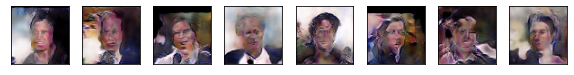

1/1 [==============================] - 0s 23ms/step


In [14]:
for step, (true_images, labels) in enumerate(train_ds):
     
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 500 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_results(syntetic_images)

### Тестирование свeрточного генератора <a id='section_3'></a>

1/1 [==============================] - 0s 23ms/step


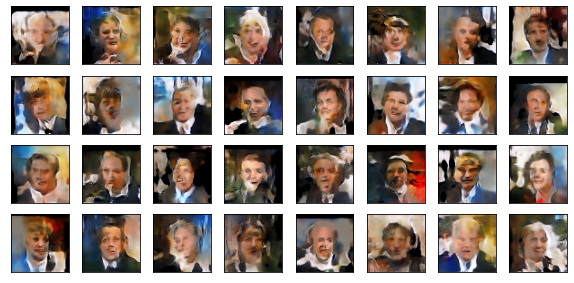

In [15]:
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_results(syntetic_images)

### Интерполяция в латентном пространстве <a id='section_4'></a>

1/1 [==============================] - 0s 20ms/step


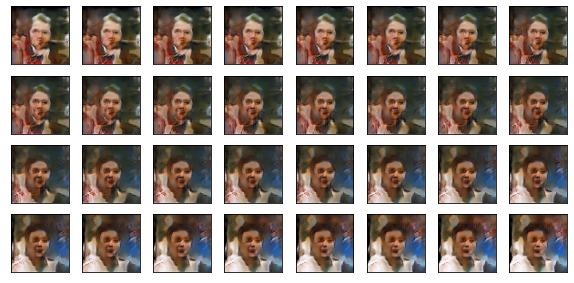

In [16]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 32)
syntetic_images = generator.predict(noise)
plot_results(syntetic_images)